# MUSA-550 Final Project

## Multi-modal interactions between the bus and bike systems in NYC

Adrián León

### Setup

In [882]:
import time
import requests
import numpy as np
import pandas as pd
import geopandas as gpd
import regex as re
from datetime import datetime

# for visualization
import contextily as ctx
import imageio
import hvplot.pandas
import holoviews as hv
import altair as alt
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.lines as mlines
import panel as pn
pn.extension('plotly')

In [2]:
# Setup

# MTABus API credentials 
APIkey ='db5001da-5754-4b8d-923f-995bc789ef68'

### Functions for calling APIs

In [3]:
# for initial analysis

# zz = {k: v for k, v in sorted(busDict.items(), key=lambda item: item[1], reverse = True)}

# df = pd.DataFrame.from_dict(zz, orient='index').reset_index()

# df.sort_values('index', ascending=True)

In [4]:
# FUNCTIONS for calling API

# function to trim extra characters from MTA codes
removeMTA = lambda x: re.sub(r'^MTA.*_','', str(x))

# function to get the line's buses data
def busesAPI(LineRef, DirectionRef):
    ''' Make API request and return the real-time status of a selected buses based on their Line.
    The arguments are the line name (in MTAs code name) and the direction of the line (0 or 1).'''
    
    # Variables to subset
    vars = ['VehicleRef',
            'VehicleLocation.Longitude',
            'VehicleLocation.Latitude',
            'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute',
            'MonitoredCall.Extensions.Distances.DistanceFromCall',
            'MonitoredCall.Extensions.Distances.StopsFromCall',
            'MonitoredCall.StopPointRef']

    # Rename variables
    varsRename = {'VehicleLocation.Longitude' : 'Longitude',
                  'VehicleLocation.Latitude' : 'Latitude',
                  'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute' : 'DistAlongRoute',
                  'MonitoredCall.Extensions.Distances.DistanceFromCall' : 'DistanceTo',
                  'MonitoredCall.Extensions.Distances.StopsFromCall' : 'StopsTo',
                  'MonitoredCall.StopPointRef' : 'StopPointRef',
                  'MonitoredCall.Extensions.Capacities.EstimatedPassengerCount' : 'EstPassengerCount'}
    
    # Bus Units API call
    busurl = f'http://bustime.mta.info/api/siri/vehicle-monitoring.json?key={APIkey}'
    
    # get requests
    busesReq = requests.get(url = busurl)
    
    # get JSON
    busesData = busesReq.json()
    
    # access JSON branch needed
    buses = busesData['Siri']['ServiceDelivery']['VehicleMonitoringDelivery'][0]['VehicleActivity']
    
    # create empty list
    busList = []
    
    # retrieve info for selected stations
    for bus in buses:
        unit = bus['MonitoredVehicleJourney']
        line = unit['LineRef']
        direction = unit['DirectionRef']
        if line == LineRef and direction == str(DirectionRef):
            busList.append(unit)
    
    countvar = ['MonitoredCall.Extensions.Capacities.EstimatedPassengerCount']
    
    # normalize and trim by variables needed
    MTAbuses = pd.json_normalize(busList)
    
    try:
        MTAbuses = MTAbuses.loc[:,vars+countvar].rename(columns=varsRename)
    except:
        MTAbuses = MTAbuses.loc[:,vars].rename(columns=varsRename)
        MTAbuses['EstPassengerCount'] = None
    
    # transform columns for simplicity
    MTAbuses['VehicleRef'] = MTAbuses['VehicleRef'].apply(removeMTA)
    MTAbuses['StopPointRef'] = MTAbuses['StopPointRef'].apply(removeMTA)
    
    return MTAbuses

# function to get each stops incoming buses data
def stopAPI(MonitoringRef, LineRef, DirectionRef):
    ''' Make API request and return the real-time status of a selected bus stop based on their Line and Stop.
    The arguments are the stop and line name (in MTAs code name) and the direction of the line (0 or 1).'''
    
        # Variables to subset
    vars = ['VehicleRef',
            'VehicleLocation.Longitude',
            'VehicleLocation.Latitude',
            'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute',
            'MonitoredCall.Extensions.Distances.DistanceFromCall',
            'MonitoredCall.Extensions.Distances.StopsFromCall',
            'MonitoredCall.StopPointRef']

    # Rename variables
    varsRename = {'VehicleLocation.Longitude' : 'Longitude',
                  'VehicleLocation.Latitude' : 'Latitude',
                  'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute' : 'DistAlongRoute',
                  'MonitoredCall.Extensions.Distances.DistanceFromCall' : 'DistanceTo',
                  'MonitoredCall.Extensions.Distances.StopsFromCall' : 'StopsTo',
                  'MonitoredCall.StopPointRef' : 'StopPointRef',
                  'MonitoredCall.Extensions.Capacities.EstimatedPassengerCount' : 'EstPassengerCount'}
    
    # Bus Stops API call
    stopurl = f'http://bustime.mta.info/api/siri/stop-monitoring.json?key={APIkey}&OperatorRef=MTA&MonitoringRef={MonitoringRef}&LineRef={LineRef}'
    
    # get requests
    stopsReq = requests.get(url = stopurl)

    # get JSON
    stopsData = stopsReq.json()
    
    # access JSON branch needed
    stops = stopsData['Siri']['ServiceDelivery']['StopMonitoringDelivery'][0]['MonitoredStopVisit']
    
    # create empty list
    stopList = []
    
    # retrieve info for selected stations
    for stop in stops:
        unit = stop['MonitoredVehicleJourney']
        line = unit['LineRef']
        direction = unit['DirectionRef']
        if line == LineRef and direction == str(DirectionRef):
            stopList.append(unit)
    
    # normalize and trim by variables needed
    MTAstops = pd.json_normalize(stopList).loc[:,vars].rename(columns=varsRename)
    
    # transform columns for simplicity
    MTAstops['VehicleRef'] = MTAstops['VehicleRef'].apply(removeMTA)
    MTAstops['StopPointRef'] = MTAstops['StopPointRef'].apply(removeMTA)
    
    return MTAstops

# function to loop the stopAPI over a list of stops
def stopsAPI(stopsList, LineRef, DirectionRef):
    ''' Make API request and return the real-time status of a selection of bus stops based on their Line.
    The arguments are a dict of stops (in 'name : code' pair), the line name (in MTAs code names) and the
    direction of the line (0 or 1).'''
    
    MTAstopsList = [stopAPI(stop, LineRef, DirectionRef) for stop in stopsList.values()]
    
    return MTAstopsList

In [5]:
# function to get each bike dock data

def bikesAPI(stations):
    '''
    Make API request and return the real-time status of selected bike stations based on their station_id.
    A dictionary must be passed.
    '''

    # API endpoint urls
    docksurl = 'https://gbfs.citibikenyc.com/gbfs/en/station_information.json'
    bikesurl = 'https://gbfs.citibikenyc.com/gbfs/en/station_status.json'
    
    # get requests
    docksReq = requests.get(url = docksurl)
    bikesReq = requests.get(url = bikesurl)
    
    # get JSON
    docksData = docksReq.json()
    bikesData = bikesReq.json()
    
    # access JSON branch needed
    docks = docksData['data']['stations']
    bikes = bikesData['data']['stations']
    
    # define variables needed
    dockVars = ['station_id','lon','lat','name','capacity']
    bikeVars = ['station_id','num_bikes_available','num_ebikes_available','num_docks_disabled','num_docks_available','num_bikes_disabled']
    
    # retrieve info for selected stations
    citidocks = [dock for dock in docks if dock['station_id'] in stations.values()]
    citibikes = [bike for bike in bikes if bike['station_id'] in stations.values()]
    
    # normalize and trim by variables needed
    citiDocks = pd.json_normalize(citidocks).loc[:,dockVars]
    citiBikes = pd.json_normalize(citibikes).loc[:,bikeVars]
    
    # merge both dataframes by station_id
    citiData = citiDocks.merge(citiBikes, how='right', on='station_id')
    
    return citiData

In [6]:
# wrapper function for making all the API calls needed over periodic intervals of time

def bikebus(transitData, interval, total):    # change limit to n of observations???
    '''transitData is a tuple with four values: a list of stations, the bus line, the direction of interest, and a
    dict of bike docks (name:value pairs) that matches the list of stations'''
    
    # Variables to subset
    vars = ['VehicleRef',
            'VehicleLocation.Longitude',
            'VehicleLocation.Latitude',
            'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute',
            'MonitoredCall.Extensions.Distances.DistanceFromCall',
            'MonitoredCall.Extensions.Distances.StopsFromCall',
            'MonitoredCall.StopPointRef']

    # Rename variables
    varsRename = {'VehicleLocation.Longitude' : 'Longitude',
                  'VehicleLocation.Latitude' : 'Latitude',
                  'MonitoredCall.Extensions.Distances.CallDistanceAlongRoute' : 'DistAlongRoute',
                  'MonitoredCall.Extensions.Distances.DistanceFromCall' : 'DistanceTo',
                  'MonitoredCall.Extensions.Distances.StopsFromCall' : 'StopsTo',
                  'MonitoredCall.StopPointRef' : 'StopPointRef',
                  'MonitoredCall.Extensions.Capacities.EstimatedPassengerCount' : 'EstPassengerCount'}
    
    timer = 0

    # unpack tuple
    MonitoringRefs, LineRef, DirectionRef, selectDocks = transitData
    
    # empty dict to put stuff in by time
    full = {}
    
    # empty dataframe for putting bike info in
    b_bikes = {}
    
    timeList = []

    while timer < interval*total:
        print(timer)
        
        # timestamp (save timestamps of each API call)
        now = datetime.now().strftime("%H:%M:%S")
        timeList.append(now)
        
        # API calls
        a_stops = stopsAPI(MonitoringRefs, LineRef, DirectionRef)
        a_buses = busesAPI(LineRef, DirectionRef)
        a_bikes = bikesAPI(selectDocks)

        # current number of observation
        n = int(timer/interval)
        
        # add to bike panel the number of bikes available at this time 
        b_bikes[n] = list(a_bikes['num_bikes_available'])
        
        full[n] = (a_stops, a_buses)
        
        # wait the interval time and increment timer to escape loop
        time.sleep(interval)
        timer = timer + interval
        
    c_bikes = pd.DataFrame.from_dict(b_bikes, orient='index')
        
    return full,c_bikes,timeList

### Get the Data

In [7]:
# BIKE and BUS data to retrieve

# Line to be requested
LineRef = 'MTA NYCT_M15'

# Direction of bus line to be requested
DirectionRef = 0

# MTA bus stops to be requested
MonitoringRefs = {'008':'401685',  #   8th st.
                  '062':'404253',  #  62nd st.
                  '111':'401725'}  # 111st st.

# Citi Bike docks to be requested
selectDocks = {'008':'438',
               '062':'3142',
               '111':'3496'}

In [8]:
# ACTUALLY getting the data

# set transit info to request
transitData = MonitoringRefs, LineRef, DirectionRef, selectDocks

# run the API coordinated call
c_allData = bikebus(transitData, interval = 90, total = 20)

0
90
180
270
360
450
540
630
720
810
900
990
1080
1170
1260
1350
1440
1530
1620
1710


In [9]:
# set transit info to request
#transitData = MonitoringRefs, LineRef, DirectionRef, selectDocks


#d_allData = bikebus(transitData, interval = 180, total = 20)

### EXPLORATION on the result data

### Functions for wrangling the results

In [11]:
# get a list of the next incoming bus per station and time

def nextBus(busData, join=False):
    '''get a list of the next incoming bus per station and time'''

    nextBusFrame = pd.DataFrame()

    for t in range(len(busData)):
        # separate for readibility
        stopData = busData[t][0]
        unitData = busData[t][1]

        # empty frame to add numbers per station
        frame = pd.DataFrame()

        for s in range(len(stopData)):
            # get the next bus incoming to that station
            a_nextBus = stopData[s].loc[stopData[s]['DistanceTo'] == stopData[s]['DistanceTo'].min()]

            a_nextBus['stop'] = s
    
            # append it to empty dataframe
            frame = frame.append(a_nextBus)

        # add n-station frame into timeseries frame
        nextBusFrame = nextBusFrame.append(frame)
    
    nextBusFrame = nextBusFrame.reset_index(drop=True)
    if join:
        nextBusFrame = [nextBusFrame.loc[nextBusFrame['stop'] == s].reset_index(drop=True) for s in range(len(stopData))]
    
    return nextBusFrame

In [12]:
# get a list of units that count how many passengers there are
def passengerCount(busData):
    
    passBusFrame = pd.DataFrame()
    
    for t in range(len(busData)):
        
        unitData = busData[t][1]
        
        # get buses with passenger counts
        c_buses = unitData.loc[unitData['EstPassengerCount'] == unitData['EstPassengerCount']]
        
        # add count by unit to frame 
        passBusFrame = passBusFrame.append(c_buses).reset_index(drop=True)
        
    return passBusFrame

In [736]:
# How to know when a bus has arrived at the station we're looking?
# --> When the 'StopsTo' value hits 0 and on the next time frame it reverts to not 0
# --> Plus: Add the bike share stats for comparison

# gets the change in bike availability in each bike-share dock paired with the nearby M15 bus station
# and how far the next bus is

def bikebusFrame(transitData):
    '''convert the full results of the API call to a summarized table comparing bike share docks availability with
    flow of incoming buses'''
    
    busData = transitData[0]
    bikeData = transitData[1]
    
    nextBusFrame = nextBus(busData, join=True)
    
    nextBusTimes = pd.DataFrame()

    for s in range(len(bikeData.columns)):
        nextBusTimes[s] = nextBusFrame[s][['StopsTo']]
    
    # rename columns for clarity

    s_names = ['008','062','111']

    bikecols = [f'{s}_bike' for s in s_names]
    stopcols = [f'{s}_stop' for s in s_names]

    # function to map new col names to dataframes based on lists of strs
    mapcols = lambda x : dict(zip(range(3), x))

    bikeChange = bikeData.rename(columns=mapcols(bikecols))
    nextBusTimes = nextBusTimes.rename(columns=mapcols(stopcols))

    # join incoming buses to bike data in one single time series
    bikebus_ts = pd.concat([nextBusTimes, bikeChange], axis=1)

    # sort columns by name to relate bus-bike  possible interactions
    bikebus_ts = bikebus_ts.reindex(sorted(bikebus_ts.columns), axis=1)
    
    return bikebus_ts


# function to know when bus arrived at station based in sliced bikebusFrame result
def whenBusArrived(stationList):
    next = 1000
    timeList = []
    for i in range(len(stationList)):
        last = next
        next = int(stationList.iloc[i])
        if next > last:
            timeList.append(i-1)
            last = next
        
    return timeList 

## Charts

### Static data

In [126]:
MTAsubwayData = pd.read_csv('./assignment-8-main/Stations.csv')

MTAsubway = MTAsubwayData.loc[MTAsubwayData['Borough'] == 'M']
MTAsubway['coordinates'] = gpd.points_from_xy(MTAsubway['GTFS Longitude'],MTAsubway['GTFS Latitude'])
MTAsubway = gpd.GeoDataFrame(MTAsubway, geometry="coordinates", crs="EPSG:4326")

MTAsubwayStops = MTAsubway[['coordinates']].to_crs(epsg=3857)

C:\Users\golet\AppData\Local\Temp/ipykernel_17836/2915005256.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MTAsubway['coordinates'] = gpd.points_from_xy(MTAsubway['GTFS Longitude'],MTAsubway['GTFS Latitude'])


In [59]:
# Prepare data to plot

# BUSES
# get static data of all MTA bus stations in Manhattan
MTAstopsData = pd.read_csv('./assignment-8-main/stops.txt')

MTAstopsData['coordinates'] = gpd.points_from_xy(MTAstopsData['stop_lon'],MTAstopsData['stop_lat'])
MTAstops = gpd.GeoDataFrame(MTAstopsData, geometry="coordinates", crs="EPSG:4326")

# list of stations that are actually in Queens and not in Manhattan
notInManh = [503357,
             503848,
             503853,
             503855,
             503870,
             503876,
             504007,
             504023,
             504053,
             504417,
             504423,
             504517,
             505254,
             550609,
             904046,
             804142,
             804143,
             804156,
             904156,
             904201,
             904202,
             904242,
             904245,
             904246]

MTAstops = MTAstops.loc[-MTAstops['stop_id'].isin(notInManh)]
MTAstops = MTAstops[['stop_id','stop_lat','stop_lon','coordinates']].to_crs(epsg=3857)

# Load data of Bus routes
MTAroutesData = pd.read_csv('./assignment-8-main/shapes.txt')

# Subset route we are observing
M15route = MTAroutesData.loc[MTAroutesData['shape_id'].isin(['M150009', 'M150010'])]

# get points with coordinates of stations in M15 northward route
M15route['coordinates'] = gpd.points_from_xy(M15route['shape_pt_lon'],M15route['shape_pt_lat'])
M15stops = gpd.GeoDataFrame(M15route, geometry="coordinates", crs="EPSG:4326")
M15stops = M15stops['coordinates'].to_crs(epsg=3857)

# get MTA stop codes for observed stations
stationCode = [int(x) for x in list(MonitoringRefs.values())]

# trim to observed stations
selectedStops = MTAstops.loc[MTAstops['stop_id'].isin(stationCode)]

stoplat = list(selectedStops['coordinates'].x)
stoplon = list(selectedStops['coordinates'].y)

# BIKES
bikeDocks = bikesAPI(selectDocks)

# get points with coordinates of stations in M15 northward route
bikeDocks['coordinates'] = gpd.points_from_xy(bikeDocks['lon'],bikeDocks['lat'])
selectedBikeDocks = gpd.GeoDataFrame(bikeDocks, geometry="coordinates", crs="EPSG:4326")
selectedBikeDocks = selectedBikeDocks['coordinates'].to_crs(epsg=3857)

docklat = list(selectedBikeDocks.x)
docklon = list(selectedBikeDocks.y)

C:\Users\golet\AppData\Local\Temp/ipykernel_17836/781532657.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  M15route['coordinates'] = gpd.points_from_xy(M15route['shape_pt_lon'],M15route['shape_pt_lat'])


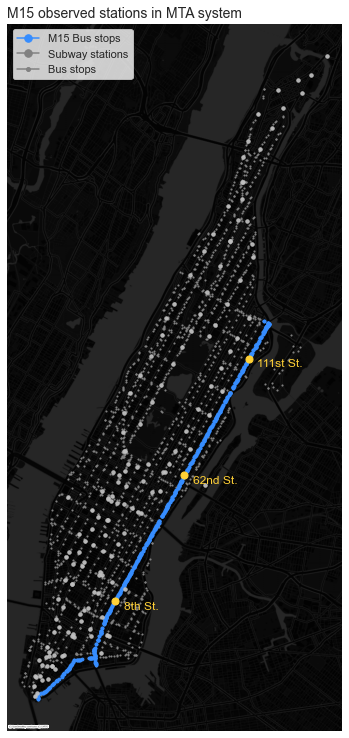

In [605]:
color1,color2 = '#ffd036','#368dff'

# create the axes
fig, ax0 = plt.subplots(figsize=(6, 18))

#plot
MTAstops.plot(ax=ax0, marker='.', color='gray', markersize=5)
M15stops.plot(ax=ax0, color=color2, markersize=8)

# plot selected stops
selectedStops.plot(ax=ax0, color=color1, markersize=50)

# Subway stations for context
MTAsubwayStops.plot(ax=ax0, color='#c1c1c1', markersize=12, alpha=.9)

buff = 333
ax0.annotate('8th St.', xy=[stoplat[0],stoplon[0]], xytext=[stoplat[0]+buff,stoplon[0]-buff], color=color1)
ax0.annotate('62nd St.', xy=[stoplat[2],stoplon[2]], xytext=[stoplat[2]+buff,stoplon[2]-buff], color=color1)
ax0.annotate('111st St.', xy=[stoplat[1],stoplon[1]], xytext=[stoplat[1]+buff,stoplon[1]-buff], color=color1)

# plot basemap
ctx.add_basemap(ax=ax0, crs=MTAstops.crs, source=ctx.providers.CartoDB.DarkMatterNoLabels, attribution_size=2)

# style
ax0.set_title('M15 observed stations in MTA system', fontsize = 14, loc='left')
ax0.set_axis_off()

M15_line = mlines.Line2D([50],[50],color=color2, marker='.',
                          markersize=15, label='M15 Bus stops')
Subway_line = mlines.Line2D([50],[50],color='#818181', marker='.',
                          markersize=15, label='Subway stations')
Bus_line = mlines.Line2D([50],[50],color='#818181', marker='.',
                          markersize=8, label='Bus stops')

ax0.legend(handles=[M15_line,Subway_line,Bus_line])

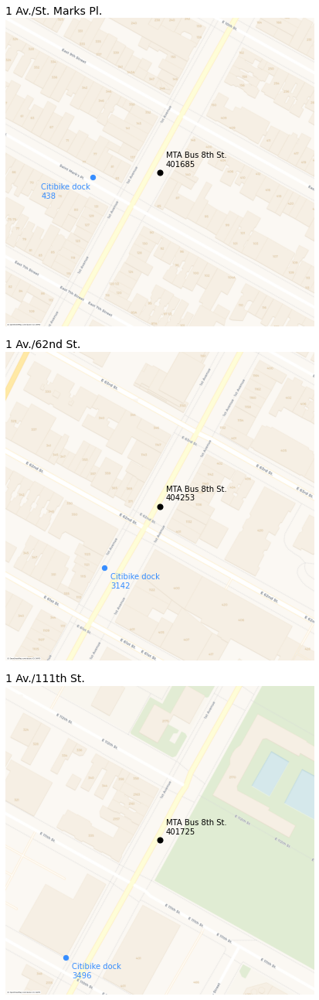

In [30]:
# create the axes
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(6, 18))
fig.tight_layout(pad=.1)
buff = 6

# STOP ONE
# plot selected stops
selectedStops.iloc[:1].plot(ax=ax1, color='black', markersize=50)
selectedBikeDocks.iloc[:1].plot(ax=ax1, color=color2, markersize=40)

point_x = stoplat[0]
point_y = stoplon[0]

# set bounding box around point
PAD = 150
ax1.set_xlim(point_x-PAD, point_x+PAD)
ax1.set_ylim(point_y-PAD, point_y+PAD)

# add annotations
ax1.annotate('MTA Bus 8th St.\n401685', xy=[point_x,point_y], xytext=[point_x+buff,point_y+buff], color='#ffffff')
ax1.annotate(f'Citibike dock\n{list(selectDocks.values())[0]}', xy=[docklat[0],docklon[0]], xytext=[docklat[0]-50,docklon[0]-20], color=color2)

# plot basemap
ctx.add_basemap(ax=ax1, crs=MTAstops.crs, source=ctx.providers.CartoDB.Voyager, attribution_size=2)

# style
ax1.set_title('1 Av./St. Marks Pl.', fontsize = 14, loc='left')
ax1.set_axis_off()

# STOP TWO
# plot selected stops
selectedStops.iloc[2:3].plot(ax=ax2, color='black', markersize=50)
selectedBikeDocks.iloc[1:2].plot(ax=ax2, color=color2, markersize=40)

point_x = stoplat[2]
point_y = stoplon[2]

# set bounding box around point
PAD = 150
ax2.set_xlim(point_x-PAD, point_x+PAD)
ax2.set_ylim(point_y-PAD, point_y+PAD)

# add annotations
ax2.annotate('MTA Bus 8th St.\n404253', xy=[point_x,point_y], xytext=[point_x+buff,point_y+buff], color='black')
ax2.annotate(f'Citibike dock\n{list(selectDocks.values())[1]}', xy=[docklat[1],docklon[1]], xytext=[docklat[1]+buff,docklon[1]-20], color=color2)

# plot basemap
ctx.add_basemap(ax=ax2, crs=MTAstops.crs, source=ctx.providers.CartoDB.Voyager, attribution_size=2)

# style
ax2.set_title('1 Av./62nd St.', fontsize = 14, loc='left')
ax2.set_axis_off()


# STOP THREE
# plot selected stops
selectedStops.iloc[1:2].plot(ax=ax3, color='black', markersize=50)
selectedBikeDocks.iloc[2:3].plot(ax=ax3, color=color2, markersize=40)

point_x = stoplat[1]
point_y = stoplon[1]

# set bounding box around point
PAD = 150
ax3.set_xlim(point_x-PAD, point_x+PAD)
ax3.set_ylim(point_y-PAD, point_y+PAD)

# add annotations
ax3.annotate('MTA Bus 8th St.\n401725', xy=[point_x,point_y], xytext=[point_x+buff,point_y+buff], color='black')
ax3.annotate(f'Citibike dock\n{list(selectDocks.values())[2]}', xy=[docklat[2],docklon[2]], xytext=[docklat[2]+buff,docklon[2]-20], color=color2)

# plot basemap
ctx.add_basemap(ax=ax3, crs=MTAstops.crs, source=ctx.providers.CartoDB.Voyager, attribution_size=2)

# remove axis lines
ax3.set_title('1 Av./111th St.', fontsize = 14, loc='left')
ax3.set_axis_off()

In [869]:
c_bbFrame = bikebusFrame(c_allData)

charts = []

for s in list(selectDocks.keys()):
    
    ss = re.sub(r'0','',s)
    
    source = c_bbFrame[[f'{s}_bike',f'{s}_stop']].reset_index()
    source[f'{s}_stop'] = c_bbFrame[[f'{s}_stop']] * -1

    bars = alt.Chart(title=f'MTA Bus Arrival and Citibike Availability Interaction over time: 1 Av/{ss} St.').mark_area(interpolate='step-after').encode(
        tooltip=[alt.Tooltip(f'{s}_bike:Q', title='bikes available'),
                 alt.Tooltip(f'{s}_stop:Q',title='stops next bus is away by')],
        x=alt.X('index:O',
                axis=alt.Axis(title='intervals observed (each 3 mins)',
                grid=True,domain=False,tickSize=0),
                scale=alt.Scale(zero=False)),
        y=alt.Y(f'{s}_bike:Q',
                axis=alt.Axis(title='distance (in stops) of next bus vs. Citibike availability',
                grid=False,domain=False,tickSize=0),
                scale=alt.Scale(domain=(-15, 25))),
        opacity=alt.OpacityValue(.7))
    
    line = alt.Chart().mark_area(opacity=.7,
                                 color='#ffa600',
                                interpolate='step').encode(x='index:O',y=f'{s}_stop:Q')
    
    busArrivals = whenBusArrived(z[f'{s}_stop'])
    
    rules = alt.Chart(pd.DataFrame({'BusArrived':busArrivals})).mark_rule().encode(x='BusArrived:O')
    
    finalChart = alt.layer(bars, line, rules, data=source).configure_view(strokeOpacity=0).properties(width=600,height=300)
    
    charts.append(finalChart)

C:\Users\golet\AppData\Local\Temp/ipykernel_17836/4198806136.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a_nextBus['stop'] = s


In [870]:
# save the chart as JSON
charts[0].save("bikecountAltair-008.json")

In [871]:
charts[1].save("bikecountAltair-062.json") 

In [872]:
charts[2].save("bikecountAltair-111.json")

In [897]:
def plotHour(df, t, bikeCount):
    """Plot the dropoffs for particular hour."""
    
    # Create a figure
    fig, ax = plt.subplots(figsize=(8,12), facecolor='#ffffff')
    
    # plot moving buses    
    df[t].plot(ax=ax, color=color1, markersize=25)
    
    # ADD CURRENT BIKES AVAILABLE IN BIKE STATIONS
    factor = 50
    selectedStops.iloc[0:1].plot(ax=ax, color=color2, markersize=bikeCount[0]*factor, alpha=0.5)
    selectedStops.iloc[1:2].plot(ax=ax, color=color2, markersize=bikeCount[2]*factor, alpha=0.5)
    selectedStops.iloc[2:3].plot(ax=ax, color=color2, markersize=bikeCount[1]*factor, alpha=0.5)
        
    # ADD LABELS
    buff = 666
    ax.annotate('  8th St.', xy=[stoplat[0],stoplon[0]], xytext=[stoplat[0]-2*buff,stoplon[0]-40], color=color2)
    ax.annotate(' 62nd St.', xy=[stoplat[2],stoplon[2]], xytext=[stoplat[2]-2*buff,stoplon[2]-40], color=color2)
    ax.annotate('111st St.', xy=[stoplat[1],stoplon[1]], xytext=[stoplat[1]-2*buff,stoplon[1]-40], color=color2)
        
    # Get the limits of the GeoDataFrame
    xmin, ymin, xmax, ymax = M15stops.total_bounds
    
    # Set the xlims and ylims
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    # plot basemap
    ctx.add_basemap(ax=ax, crs=MTAstops.crs, source=ctx.providers.CartoDB.DarkMatterNoLabels, attribution_size=2)

    # style
    ax.set_title(f'M15Bus and citibike Availability Interaction: {c_allData[2][t]}', fontsize = 14, loc='left')
    ax.set_axis_off()
    
    M15_line = mlines.Line2D([50],[50],color=color2, marker='.',
                          markersize=15, label='CitiBikes available')
    Bus_line = mlines.Line2D([50],[50],color=color1, marker='.',
                          markersize=8, label='M15 Bus units')
    
    ax.legend(handles=[M15_line,Bus_line],loc='upper left')

    # Format the axis and figure
    ax.set_aspect("equal")
    ax.set_axis_off()
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    # Draw the figure and return the image
    # This converts our matplotlib Figure into a format readable by imageio
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image


C:\Users\golet\AppData\Local\Temp/ipykernel_17836/2927321178.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8,12), facecolor='#ffffff')


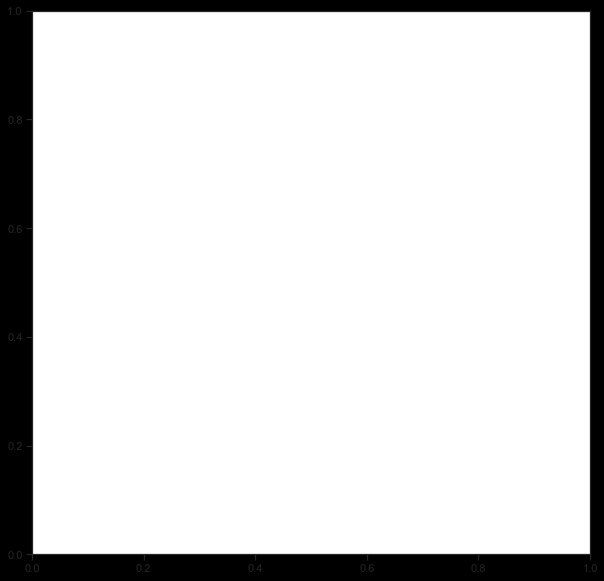

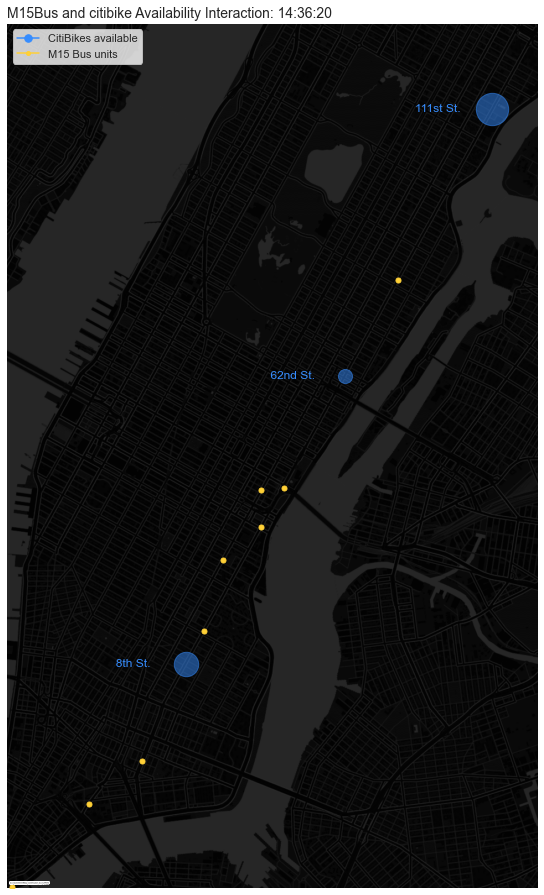

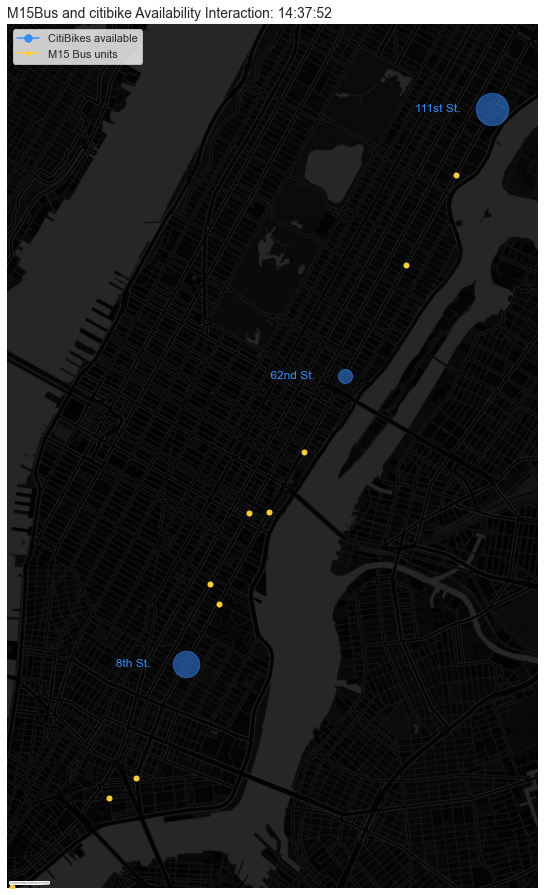

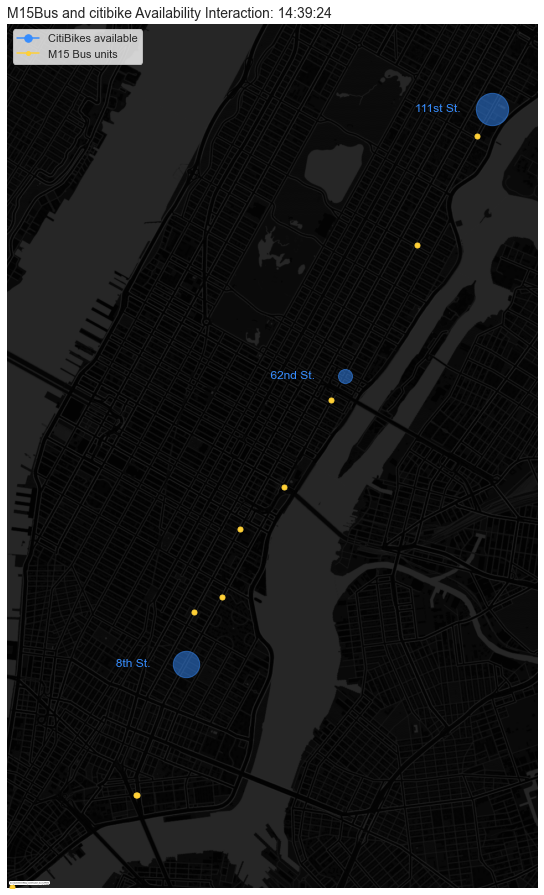

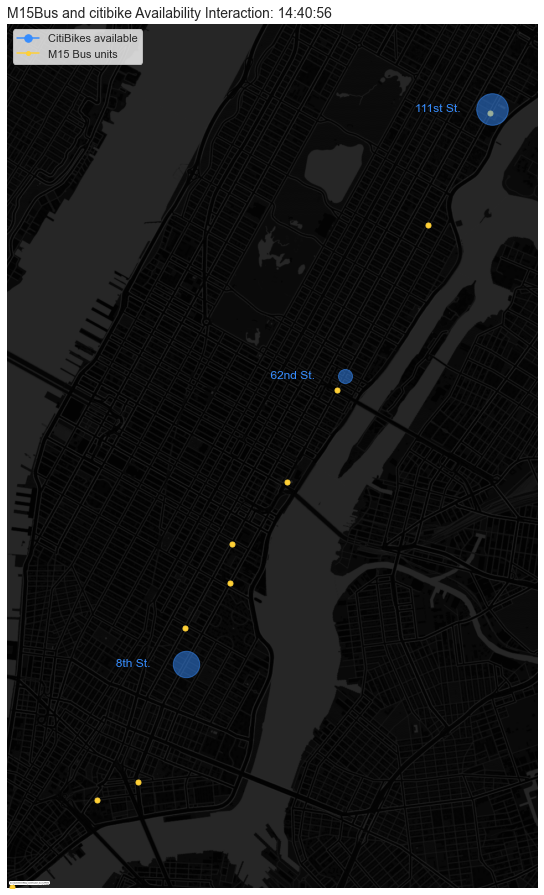

...

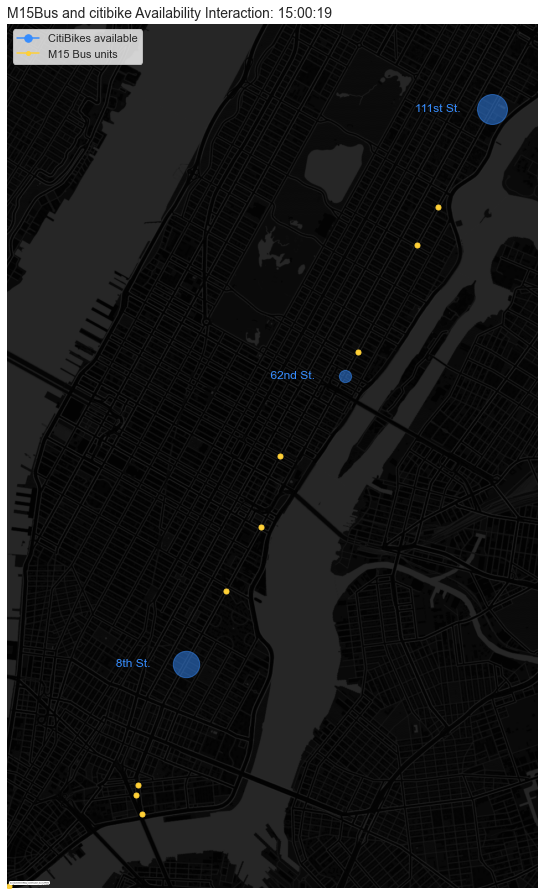

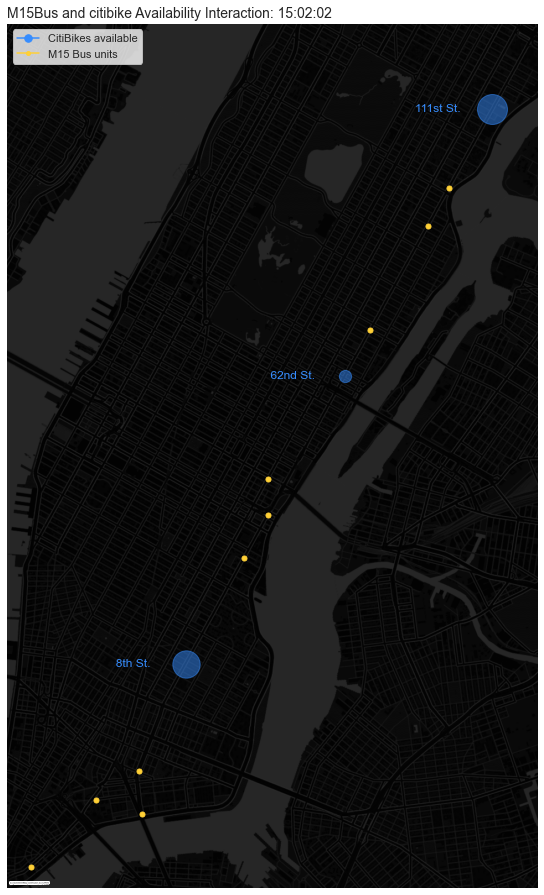

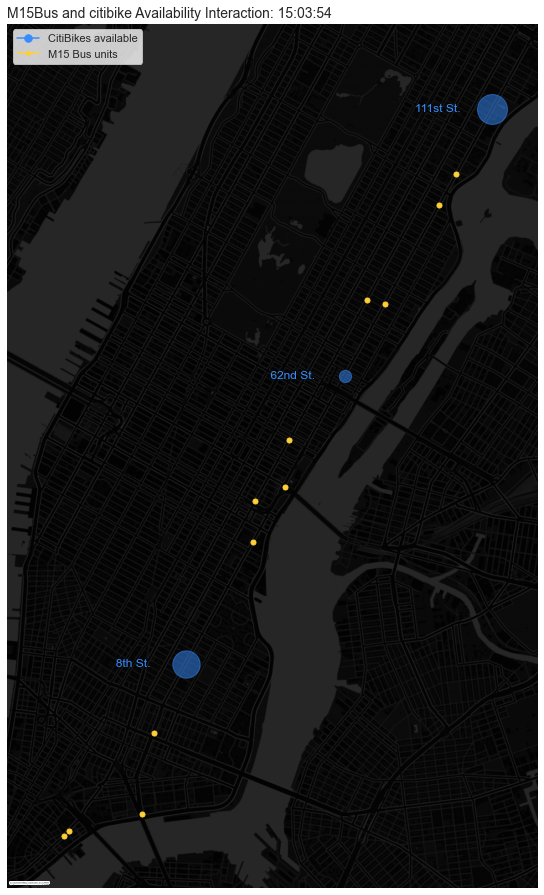

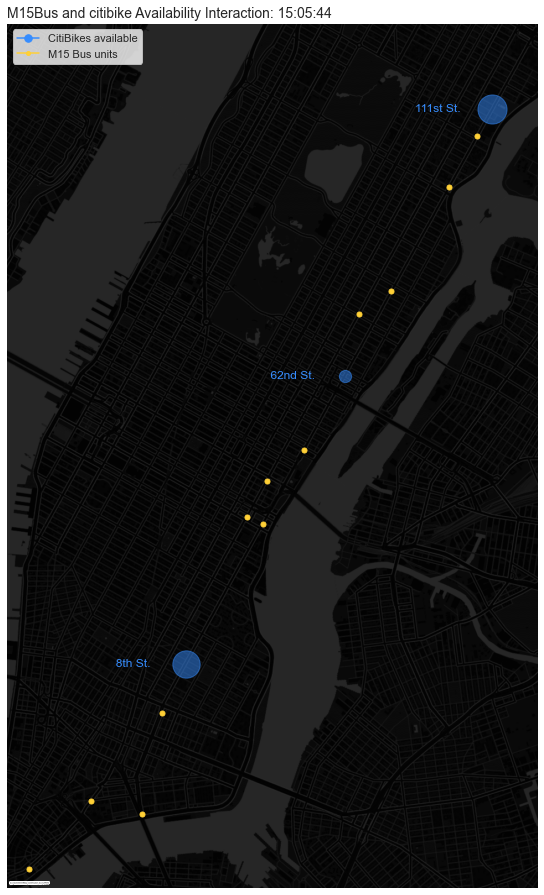

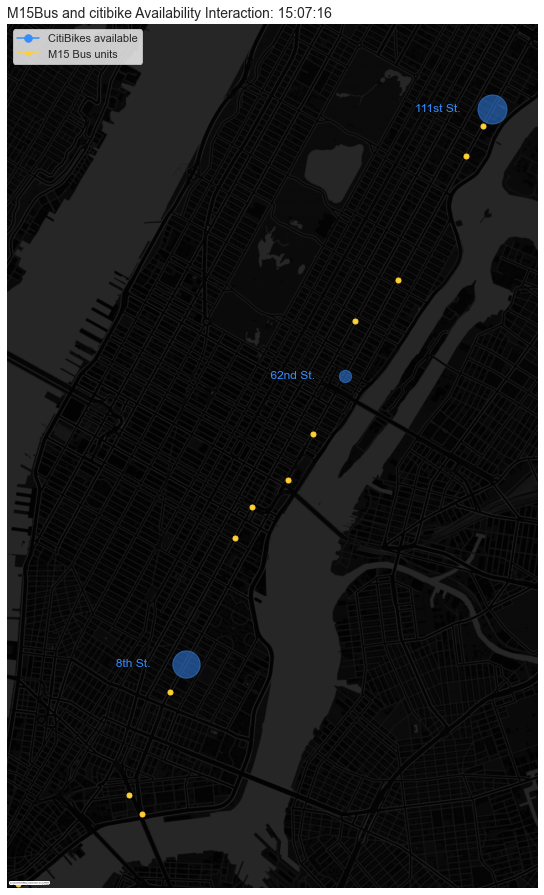

In [898]:
gifList = []

for t in range(len(c_allData[0])):
    gif_dfa = c_allData[0][t][0][0]  
    gif_dfb = c_allData[0][t][0][1]  
    gif_dfc = c_allData[0][t][0][2]

    dfd = gif_dfa.append([gif_dfb,gif_dfc]).drop_duplicates('VehicleRef')[['VehicleRef','Latitude','Longitude']]
    dfd['coordinates'] = gpd.points_from_xy(dfd['Longitude'], dfd['Latitude'])
    dfe = gpd.GeoDataFrame(dfd, geometry="coordinates", crs="EPSG:4326").to_crs(epsg=3857)
    gifList.append(dfe)

fig, ax = plt.subplots(figsize=(10,10), facecolor='black')

# Create an image for each hour
imgs = []
for t in range(len(gifList)):
    
    bikeCount = list(c_allData[1].iloc[t])
    
    # Plot the datashaded image for this specific hour
    img = plotHour(gifList, t, bikeCount)
    imgs.append(img)
    
# Combing the images for each hour into a single GIF
imageio.mimsave('busBike.gif', imgs, fps=5);

### Passenger Count

In [899]:
def plotPassCount(df, t, bikeCount):
    """Plot the dropoffs for particular hour."""
    
    # Create a figure
    fig, ax = plt.subplots(figsize=(8,12), facecolor='#ffffff')
    
    # plot moving buses
    factor = 50
    timeframeA = df[0].iloc[[t]]
    timeframeA.plot(ax=ax, color=color1, markersize=timeframeA[['EstPassengerCount']]*factor)
    try:
        timeframeB = df[1].iloc[[t]]
        timeframeB.plot(ax=ax, color=color1, markersize=timeframeB[['EstPassengerCount']]*factor)
    except:
        pass
    # ADD CURRENT BIKES AVAILABLE IN BIKE STATIONS  
    selectedStops.iloc[0:1].plot(ax=ax, color=color2, markersize=bikeCount[0]*10, alpha=0.5)
    selectedStops.iloc[1:2].plot(ax=ax, color=color2, markersize=bikeCount[2]*10, alpha=0.5)
    selectedStops.iloc[2:3].plot(ax=ax, color=color2, markersize=bikeCount[1]*10, alpha=0.5)
        
    # ADD LABELS
    buff = 500
    ax.annotate('  8th St.', xy=[stoplat[0],stoplon[0]], xytext=[stoplat[0]-2*buff,stoplon[0]-40], color=color2)
    ax.annotate(' 62nd St.', xy=[stoplat[2],stoplon[2]], xytext=[stoplat[2]-2*buff,stoplon[2]-40], color=color2)
    ax.annotate('111st St.', xy=[stoplat[1],stoplon[1]], xytext=[stoplat[1]-2*buff,stoplon[1]-40], color=color2)
        
    # Get the limits of the GeoDataFrame
    xmin, ymin, xmax, ymax = M15stops.total_bounds
    
    # Set the xlims and ylims
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    # plot basemap
    ctx.add_basemap(ax=ax, crs=MTAstops.crs, source=ctx.providers.CartoDB.DarkMatterNoLabels, attribution_size=2)

    # style
    ax.set_title(f'M15Bus Passenger Counts: {c_allData[2][t]}', fontsize = 14, loc='left')
    ax.set_axis_off()
    
    M15_line = mlines.Line2D([50],[50],color=color2, marker='.',
                          markersize=15, label='CitiBikes available')
    Bus_line = mlines.Line2D([50],[50],color=color1, marker='.',
                          markersize=8, label='M15 Bus units')
    
    ax.legend(handles=[M15_line,Bus_line],loc='upper left')

    # Format the axis and figure
    ax.set_aspect("equal")
    ax.set_axis_off()
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

    # Draw the figure and return the image
    # This converts our matplotlib Figure into a format readable by imageio
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype="uint8")
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

In [905]:
passData = passengerCount(c_allData[0])

passData6079 = passData.loc[passData['VehicleRef'] == '6079'].reset_index(drop=True)
passData6105 = passData.loc[passData['VehicleRef'] == '6105'].reset_index(drop=True)

passData6079['coordinates'] = gpd.points_from_xy(passData6079['Longitude'], passData6079['Latitude'])
passData6079 = gpd.GeoDataFrame(passData6079, geometry="coordinates", crs="EPSG:4326").to_crs(epsg=3857)

passData6105['coordinates'] = gpd.points_from_xy(passData6105['Longitude'], passData6105['Latitude'])
passData6105 = gpd.GeoDataFrame(passData6105, geometry="coordinates", crs="EPSG:4326").to_crs(epsg=3857)


C:\Users\golet\AppData\Local\Temp/ipykernel_17836/3427109016.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8,12), facecolor='#ffffff')


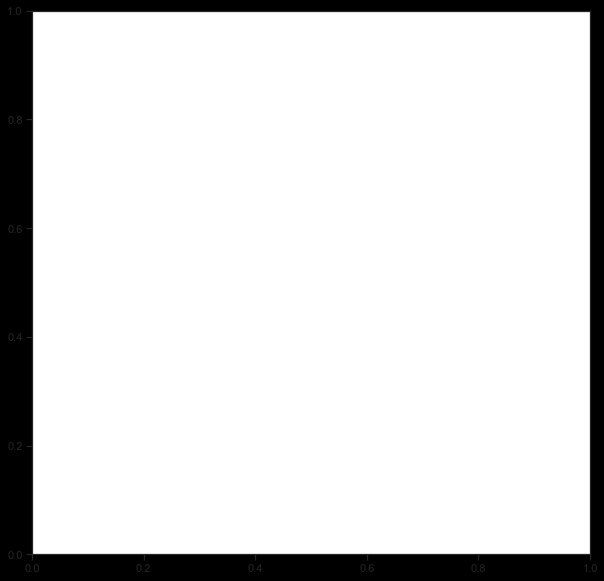

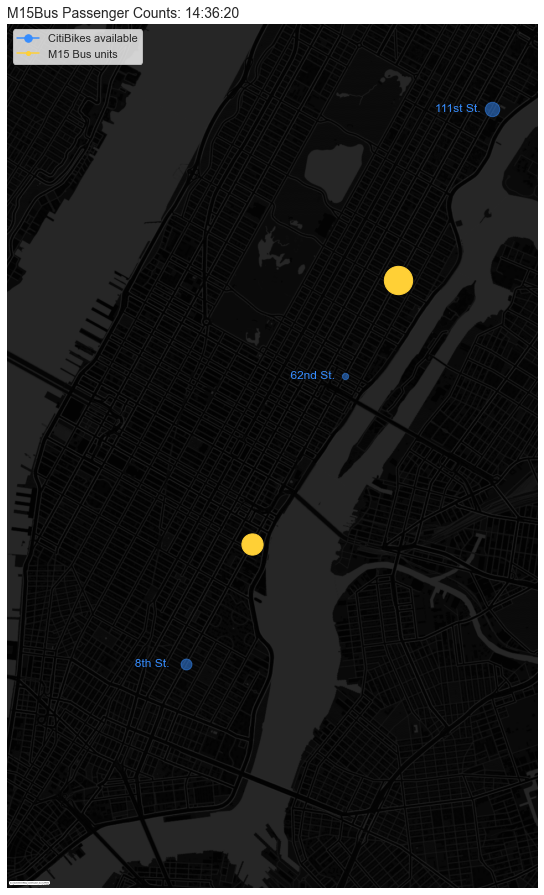

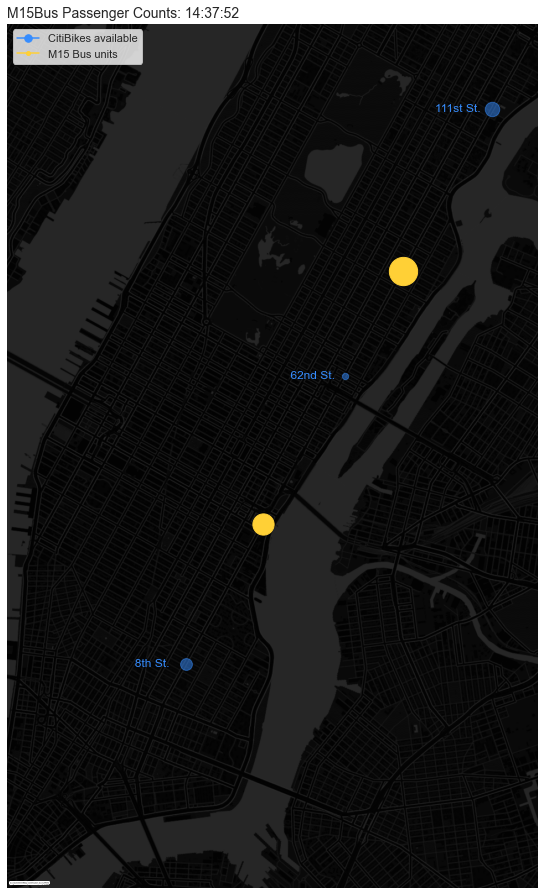

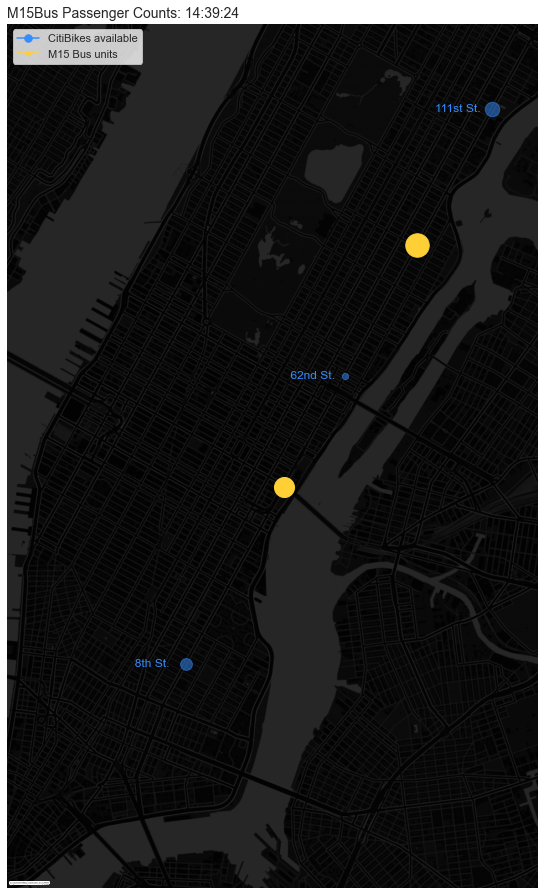

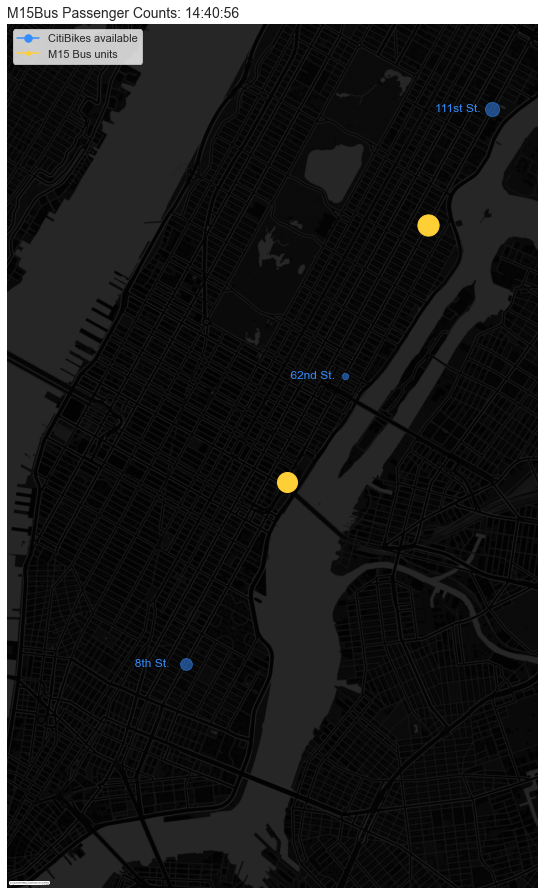

...

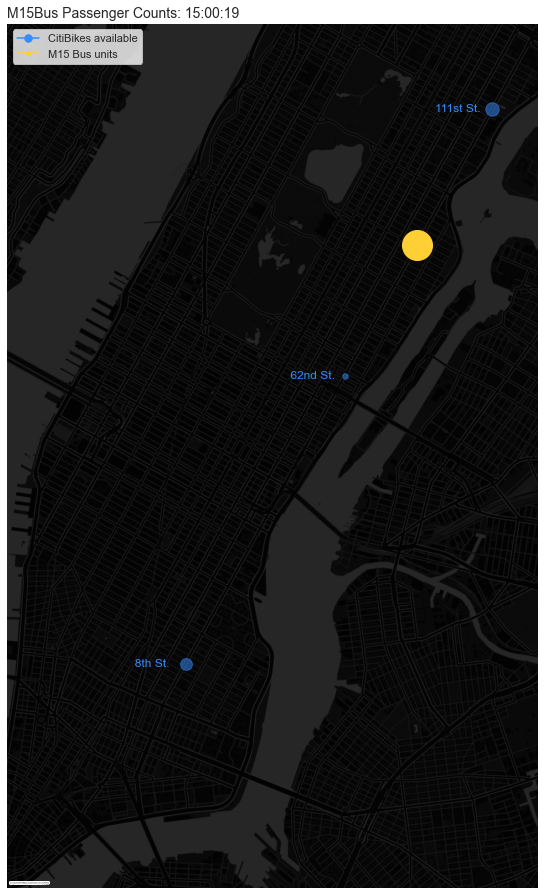

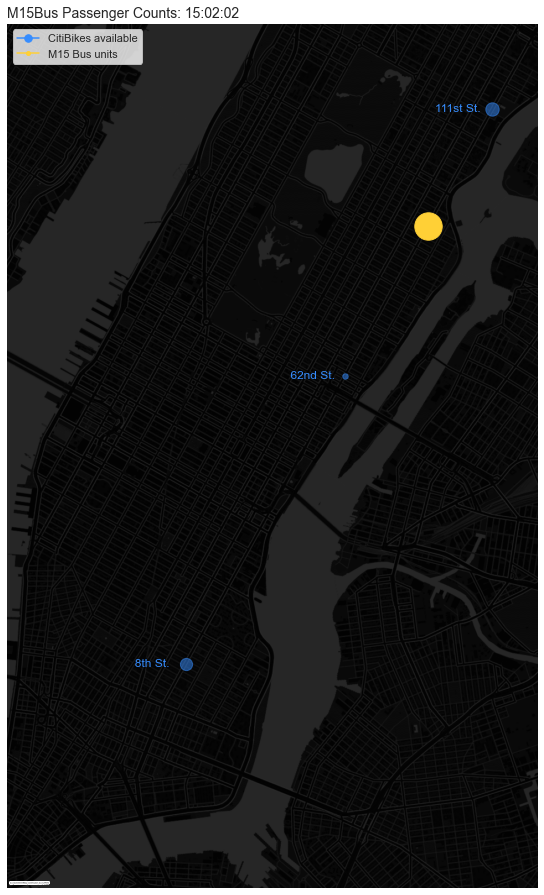

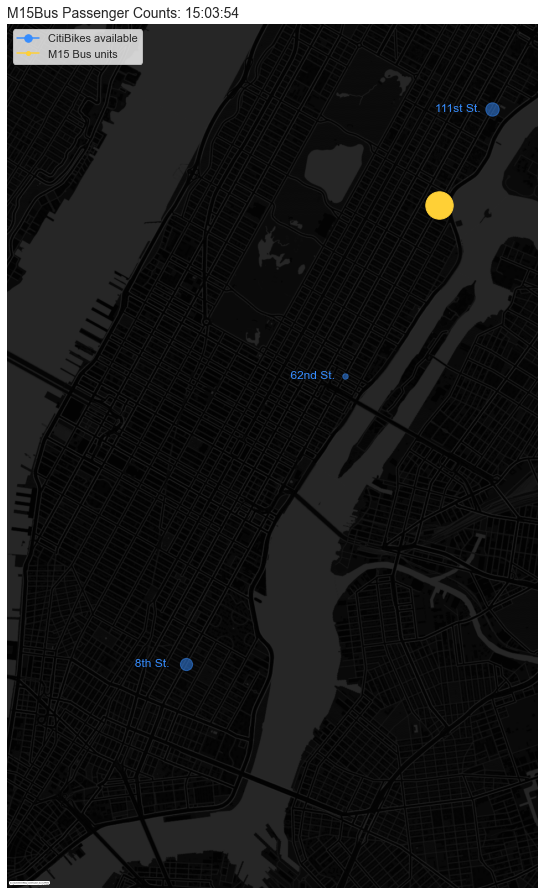

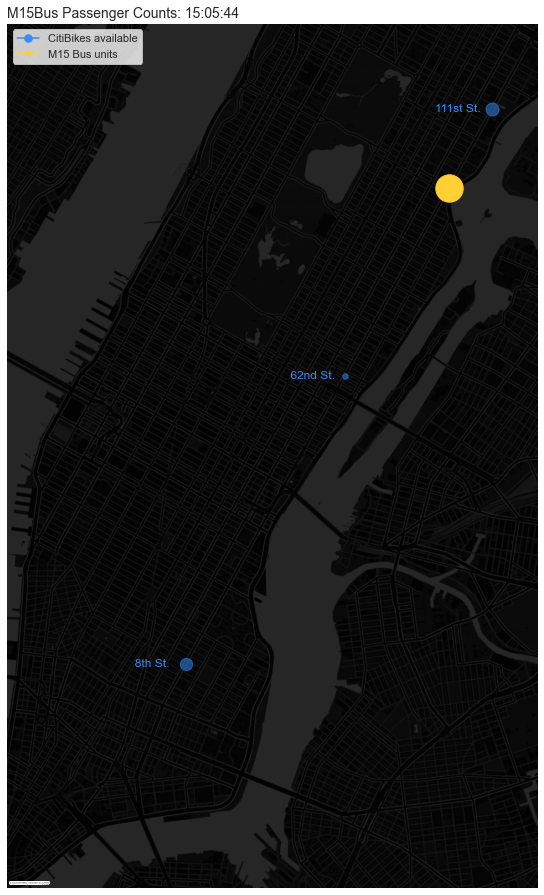

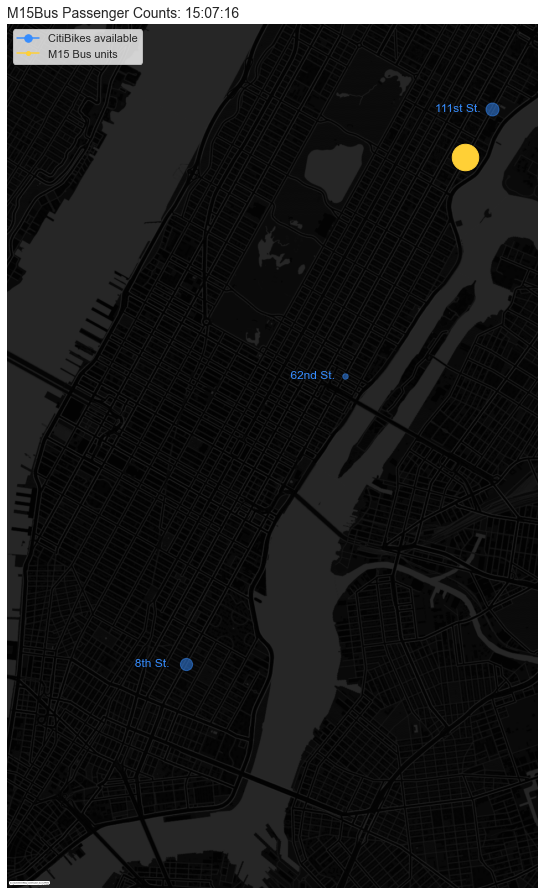

In [906]:
# PLOT GIF
fig, ax = plt.subplots(figsize=(10,10), facecolor='black')

# Create an image for each hour
imgs = []
for t in range(len(gifList)):
    
    unitList = [passData6079,passData6105]
    bikeCount = list(c_allData[1].iloc[t])
    
    # Plot the datashaded image for this specific hour
    img = plotPassCount(unitList, t, bikeCount)
    imgs.append(img)
    
# Combing the images for each hour into a single GIF
imageio.mimsave('busPass.gif', imgs, fps=5);

In [908]:
passDataRB = passData6079.append(passData6105)

passChart = passDataRB.reset_index()

stopWhere = passChart.loc[passChart['StopPointRef'].isin(list(MonitoringRefs.values()))].iloc[[-1]]['index']

passChartHV = passChart.hvplot.bar(x='index', y='EstPassengerCount',
                                   groupby='VehicleRef', color=color2, line_color=None).opts(bgcolor=color1, width=300, height=200)
stopvline = hv.VLine(int(stopWhere)).opts(color='black', line_width = 1)

textHV = hv.Text(int(stopWhere)-1, 23, '62nd St.\nbus stop', fontsize=6)

chartHV = passChartHV * stopvline * textHV

In [909]:
chartHV

:DynamicMap   [VehicleRef]
   :Overlay
      .Bars.I  :Bars   [index]   (EstPassengerCount)
      .VLine.I :VLine   [x,y]
      .Text.I  :Text   [x,y]

In [911]:
hvplot.save(chartHV, 'passengerCount2.html')